# Explore Given Data Set

In [9]:
import PIL
from PIL import Image
import os
import matplotlib.pyplot as plt
from glob import glob
import pandas as pd 
import numpy as np

project_path = os.path.normpath(os.path.join(os.getcwd(), '../'))
train_path = os.path.join(project_path, 'datasets/train/')
cells_path = os.path.join(project_path, 'datasets/cells/')

def get_meta(path, file_type, glob_col = "file_path"): 
    file_list = glob(os.path.join(path, f"*.{file_type}"))
    meta_df = pd.DataFrame(file_list, columns=[glob_col])
    meta_df["file_name"] = meta_df[glob_col].apply(lambda f: os.path.basename(f))
    meta_df["item_name"] = meta_df["file_name"].apply(lambda g: os.path.splitext(g)[0])
    
    return meta_df

train_tifs = glob(train_path + "*.tif")
cells_tifs = glob(cells_path + "*.tif")
cells_xmls = glob(cells_path + "*.xml")

train_labels = pd.read_csv(os.path.join(project_path, 'datasets/train_labels.csv'))

In [10]:
import re
cells_tif_meta = get_meta(cells_path, file_type="tif")
cells_tif_meta["base_name"] = cells_tif_meta["item_name"].apply(lambda x: "_".join(x.split("_")[:-1]))
cells_tif_meta["item_type"] = cells_tif_meta["item_name"].apply(lambda x: x.split("_")[-1])
cells_xml_meta = get_meta(cells_path, file_type="xml")
cells_xml_meta["base_name"] = cells_xml_meta["item_name"].apply(lambda x:  "_".join(x.split("_")[:-1]))

cells_meta = cells_tif_meta.merge(
    cells_xml_meta, 
    on="base_name", 
    how="outer", 
    suffixes = ["_tif", "_xml"]
)

print(len(cells_meta), len(cells_tif_meta), len(cells_xml_meta))

308 308 154


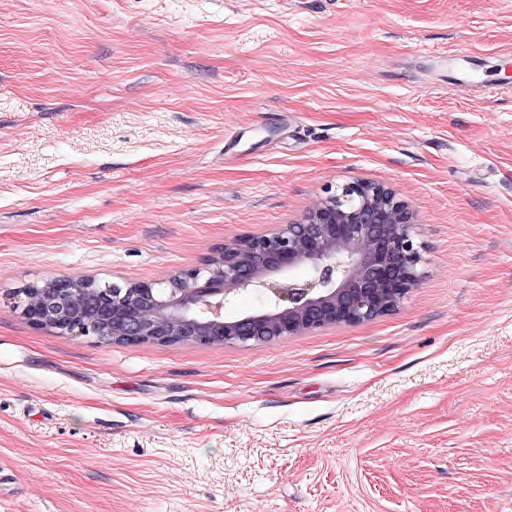

In [3]:
# Read train_image
train_tif = train_tifs[0]
PIL.Image.open(train_tif)

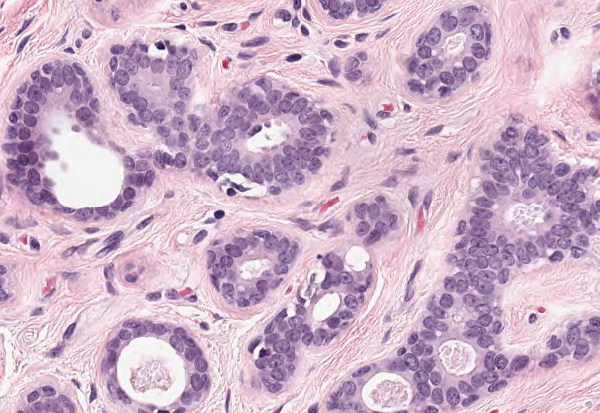

In [4]:
cells_tif = cells_tifs[0]
PIL.Image.open(cells_tif)

In [5]:
# Create cell mask from cells_tif
import xml.etree.ElementTree as ET
# First read in cell xml
def get_ptslist_from_str(xml_str, graphic_tag='graphic'): 
    elem_open_indices = [idx for (idx, line) in enumerate(xml_str) if f"<{graphic_tag}" in line]
    elem_close_indices = [idx for (idx, line) in enumerate(xml_str) if f"</{graphic_tag}" in line]
    
    elem_lines = [ 
        [l.strip() for l in xml_str[start:end+1]]
        for (start, end) in zip(elem_open_indices, elem_close_indices)
        ]
    
    return [ET.XML('\n'.join(elem_line)) for elem_line in elem_lines]

def get_pts_from_graphic(graphic_elem, point_list_tag="point-list"):
    
    point_list_elem = graphic_elem.findall("point-list")[0]
    
    pts_df = pd.DataFrame([
        [int(p) for p in point_elem.text.split(",")] 
        for point_elem in point_list_elem
    ], columns=["x","y"])
    
    for key, val in graphic_elem.attrib.items(): 
        pts_df[key] = [val]*len(pts_df)

    return pts_df
 

In [6]:
import numpy as np
idx = np.random.randint(low=0, high=len(cells_xmls), size=1)[0]
with open(cells_xmls[idx], 'r') as f: 
    raw_xml = f.readlines()
    
graphic_list = get_ptslist_from_str(raw_xml, graphic_tag="graphic")

pts_dfs = pd.DataFrame()
for graphic_elem in graphic_list: 
    pts_df = get_pts_from_graphic(graphic_elem)
    pts_dfs = pd.concat([pts_dfs, pts_df], axis=0)

In [7]:
from tqdm import tqdm_notebook as tqdm
all_cells_regions_pts_dfs = pd.DataFrame()
for idx, row in tqdm(cells_xml_meta.iterrows(), total=len(cells_xml_meta)):
    with open(row['file_path'], 'r') as f: 
        raw_xml = f.readlines()
        graphic_list = get_ptslist_from_str(raw_xml, graphic_tag="graphic")
    pts_dfs = pd.DataFrame()
    for graphic_elem in graphic_list: 
        pts_df = get_pts_from_graphic(graphic_elem)
        pts_dfs = pd.concat([pts_dfs, pts_df], axis=0)
        
    all_cells_regions_pts_dfs = pd.concat([all_cells_regions_pts_dfs, pts_dfs], axis=0)

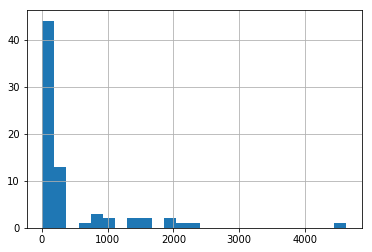

In [8]:
# Visualize region with high vs. low cellularity
# train_labels['y'].hist(bins=30)
all_cells_regions_pts_dfs.groupby(['name'])['x'].agg('count').hist(bins=25)

Text(0.5,1,'high cellularity: y=0.95, 99845_4.tif')

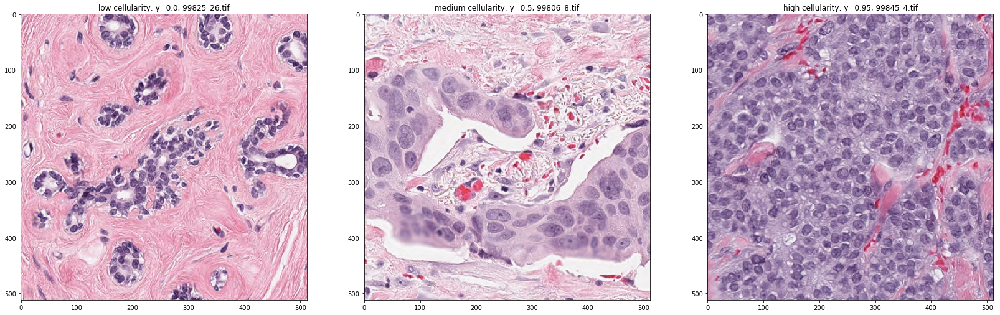

In [60]:
high_cellularity_labels = train_labels[train_labels['y'] >= 0.9]
medium_cellularity_labels = train_labels[(train_labels['y'] >= 0.35) & (train_labels['y'] <= 0.65)]
low_cellularity_labels = train_labels[train_labels['y'] <= 0.1]

hidx = np.random.randint(low=0, high=len(high_cellularity_labels), size=1)[0]
hrow = high_cellularity_labels.iloc[hidx]
hfile = os.path.join(train_path, f"{int(hrow['slide'])}_{int(hrow['rid'])}.tif")

midx = np.random.randint(low=0, high=len(medium_cellularity_labels), size=1)[0]
mrow = medium_cellularity_labels.iloc[midx]
mfile = os.path.join(train_path, f"{int(mrow['slide'])}_{int(mrow['rid'])}.tif")

lidx = np.random.randint(low=0, high=len(low_cellularity_labels), size=1)[0]
lrow = low_cellularity_labels.iloc[lidx]
lfile = os.path.join(train_path, f"{int(lrow['slide'])}_{int(lrow['rid'])}.tif")

fig, axes = plt.subplots(1, 3, figsize=(28, 9))
axes[0].imshow(plt.imread(lfile))
axes[0].set_title(f"low cellularity: y={lrow['y']}, {os.path.basename(lfile)}")
axes[1].imshow(plt.imread(mfile))
axes[1].set_title(f"medium cellularity: y={mrow['y']}, {os.path.basename(mfile)}")
axes[2].imshow(plt.imread(hfile))
axes[2].set_title(f"high cellularity: y={hrow['y']}, {os.path.basename(hfile)}")

# Explore External DataSet MonuSeq

In [8]:
# Representation Learning for Nuclear Segmentation
# Use external data: /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/Annotations/
# https://monuseg.grand-challenge.org/Data/
# Predict on provided data in cells folder

# Read MoNuSeg Annotation:
monuseg_path = '/Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/'
monuseg_xmls = get_meta(os.path.join(monuseg_path, "Annotations"), file_type="xml")
monuseg_imgs = get_meta(os.path.join(monuseg_path, "TissueImages"), file_type="tif")
monuseg_meta = monuseg_xmls.merge(monuseg_imgs, on='item_name', suffixes=["_xml", "_tif"])

NameError: name 'get_meta' is not defined

## Work with one data instance

In [8]:
def get_pts_from_regions(region_elem, vertex_tag="Vertex"):    
    vertices_elem = region_elem.findall("Vertices")[0].findall(vertex_tag)
    pts_df = pd.DataFrame([vertex_elem.attrib for vertex_elem in vertices_elem])
    pts_df.columns=['x', 'y']
    
    for key, val in region_elem.attrib.items(): 
        pts_df[key] = [val]*len(pts_df)

    return pts_df

idx = np.random.randint(low=0, high=len(monuseg_meta), size=1)[0]
row = monuseg_meta.iloc[idx]

with open(row['file_path_xml'], 'r') as f: 
    raw_nuc_xml = f.readlines()
    
regions_elem = get_ptslist_from_str(xml_str=raw_nuc_xml, graphic_tag='Regions')
region_elem_list = regions_elem[0].findall("Region")
region_elem = region_elem_list[0]

region_pts_dfs = pd.DataFrame()
for region_elem in region_elem_list: 
    region_pts_df = get_pts_from_regions(region_elem)
    region_pts_dfs = pd.concat([region_pts_dfs, region_pts_df], axis=0)

In [11]:
# Compute centroid
region_pts_dfs = region_pts_dfs.drop_duplicates()
region_pts_dfs['x'] = region_pts_dfs['x'].astype(float)
region_pts_dfs['y'] = region_pts_dfs['y'].astype(float)
region_centroids = region_pts_dfs.groupby('Id')[['x', 'y']].agg(np.mean).reset_index()
# region_points = region_pts_dfs.groupby('Id').apply(lambda x: x.sample(frac=0.1)).reset_index()
region_points = region_pts_dfs.groupby('Id')[['x', 'y']].apply(lambda x: x.sample(frac=0.2))
print(len(region_centroids), len(region_points), len(region_pts_dfs))

378 20602 103003


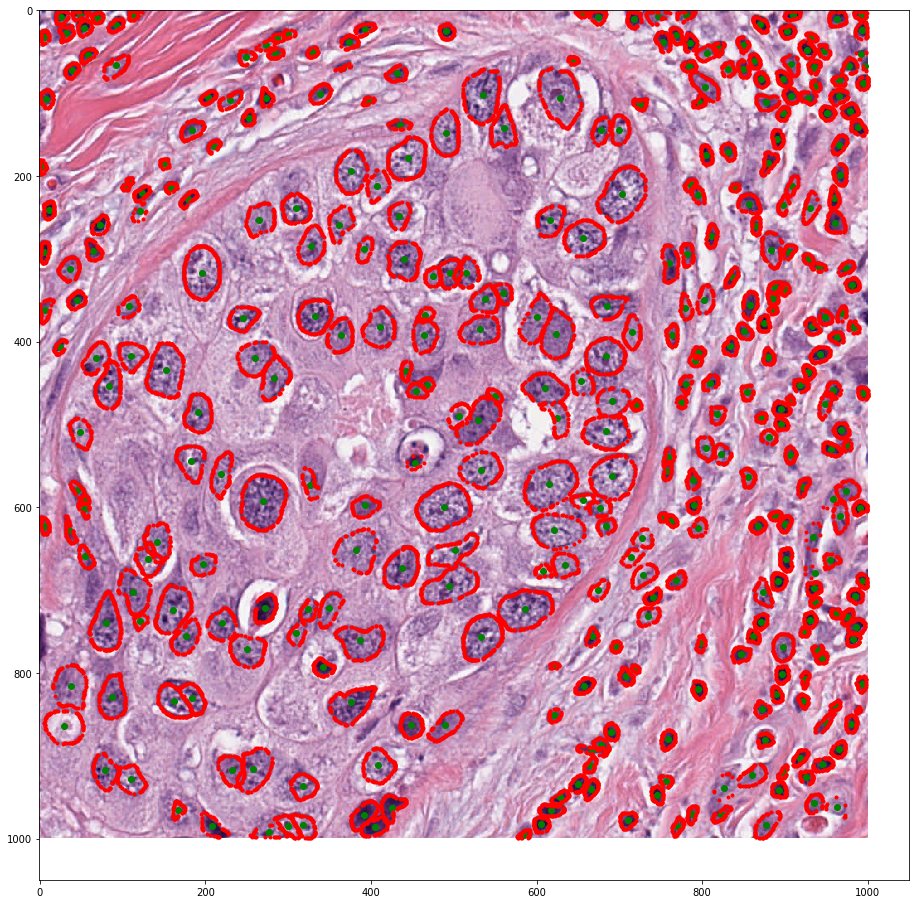

In [53]:
img = PIL.Image.open(row['file_path_tif'])
fig, ax = plt.subplots(figsize=(16, 16))
plt.imshow(img)
plt.plot(region_centroids['x'], region_centroids['y'], 'go')
plt.plot(region_points['x'], region_points['y'], 'r.')
plt.show()

In [21]:
num_regions = len(region_pts_dfs['Id'].unique())
nuc_mask = np.zeros((img.size[0], img.size[1], num_regions), dtype=float)
region_pts_dfs['Id'] = region_pts_dfs['Id'].astype(int)

In [46]:
from matplotlib.path import Path
from tqdm import tqdm_notebook as tqdm

x, y = np.meshgrid(np.arange(img.size[0]), np.arange(img.size[1])) # make a canvas with coordinates
x, y = x.flatten(), y.flatten()
points = np.vstack((x,y)).T 

num_regions = len(region_pts_dfs['Id'].unique())
nuc_mask = np.zeros((img.size[0], img.size[1], num_regions), dtype=float)
nuc_mask.shape

for idx, nuc_id in tqdm(enumerate(region_pts_dfs['Id'].unique()), total=num_regions): 
    grp = region_pts_dfs[region_pts_dfs['Id']==nuc_id]
    p = Path(list(zip(grp['x'], grp['y'])))
    grid = p.contains_points(points)
    mask = grid.reshape(img.size[0], img.size[1]).astype(int)
    nuc_mask[:, :, idx] = mask*idx
    
nuc_groundtruth = np.amax(nuc_mask, axis=2).astype(int)

Text(0.5,1,'labeled nuclei image TCGA-E2-A14V-01Z-00-DX1')

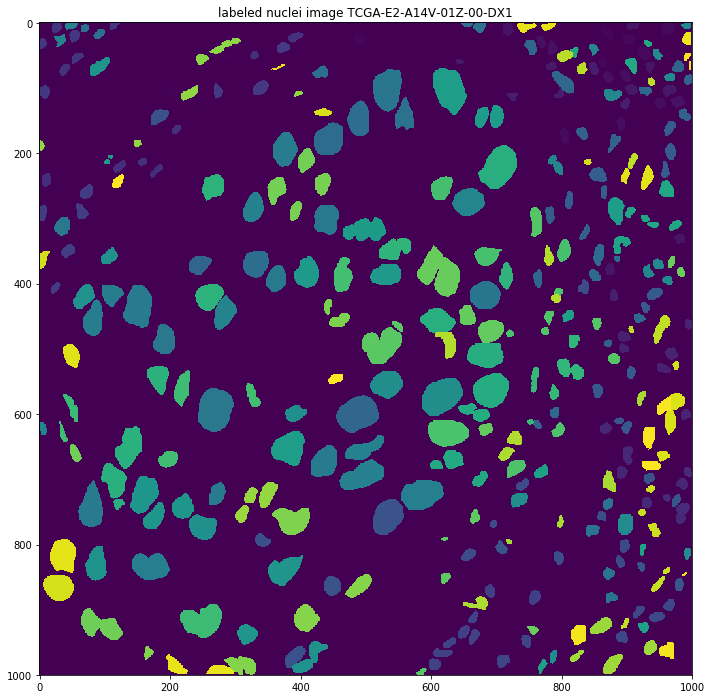

In [56]:
fig, ax = plt.subplots(figsize=(12, 12))
plt.imshow(nuc_groundtruth)
plt.title(f"labeled nuclei image {row['item_name']}")

In [14]:
def get_nuc_regions(raw_nuc_xml, graphic_tag='Regions', elem_tag="Region"):
    regions_elem = get_ptslist_from_str(xml_str=raw_nuc_xml, graphic_tag=graphic_tag)
    region_elem_list = regions_elem[0].findall(elem_tag)
    region_elem = region_elem_list[0]

    region_pts_dfs = pd.DataFrame()
    for region_elem in region_elem_list: 
        region_pts_df = get_pts_from_regions(region_elem)
        region_pts_dfs = pd.concat([region_pts_dfs, region_pts_df], axis=0)
    
    region_pts_dfs['x'] = region_pts_dfs['x'].astype(float)
    region_pts_dfs['y'] = region_pts_dfs['y'].astype(float)

    return region_pts_dfs

def get_bounded_pts(img, region_pts_dfs):
    x, y = np.meshgrid(np.arange(img.size[0]), np.arange(img.size[1])) # make a canvas with coordinates
    x, y = x.flatten(), y.flatten()
    points = np.vstack((x,y)).T 

    num_regions = len(region_pts_dfs['Id'].unique())
    nuc_mask = np.zeros((img.size[0], img.size[1], num_regions), dtype=float)

    for idx, nuc_id in tqdm(enumerate(region_pts_dfs['Id'].unique()), total=num_regions): 
        grp = region_pts_dfs[region_pts_dfs['Id']==nuc_id]
        p = Path(list(zip(grp['x'], grp['y'])))
        grid = p.contains_points(points)
        mask = grid.reshape(img.size[0], img.size[1]).astype(int)
        nuc_mask[:, :, idx] = mask*idx

    nuc_groundtruth = np.amax(nuc_mask, axis=2).astype(int)
    
    return nuc_groundtruth

## Build Nuclei Segmentation Groundtruth from MoNuSeg Data Set

In [75]:
# Build MoNuSeg nuclei segmentation ground truth
# 1. Create metadata df
# Read MoNuSeg Annotation:
monuseg_path = '/Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/'
monuseg_xmls = get_meta(os.path.join(monuseg_path, "Annotations"), file_type="xml")
monuseg_imgs = get_meta(os.path.join(monuseg_path, "TissueImages"), file_type="tif")
monuseg_meta = monuseg_xmls.merge(monuseg_imgs, on='item_name', suffixes=["_xml", "_tif"])

# 2. Iterate through monuseg_meta
grouth_truth_img_path = os.path.join(monuseg_path, "LabeledNucImages")
centroid_output_path = os.path.join(monuseg_path, "NucCentroids")

for output_dir in [grouth_truth_img_path, centroid_output_path]:
    if not os.path.isdir(output_dir): 
        os.makedirs(output_dir)
    
for idx, instance in tqdm(monuseg_meta.iterrows(), total=len(monuseg_meta)):
    with open(instance['file_path_xml'], 'r') as f: 
        raw_nuc_xml = f.readlines()
        
    print(f"Parsing xml for {instance['item_name']}")
    region_pts_dfs = get_nuc_regions(raw_nuc_xml, graphic_tag='Regions', elem_tag="Region")
    region_pts_dfs.groupby('Id')[['x', 'y']].agg(np.mean).reset_index()
    region_centroids = region_pts_dfs.groupby('Id')[['x', 'y']].agg(np.mean).reset_index()
    # Save region centroids
    region_centroids.to_csv(os.path.join(centroid_output_path, f"{instance['item_name']}.csv"), index=False)
    
    print(f"Creating groundtruth image for {instance['item_name']}")
    img = PIL.Image.open(instance['file_path_tif'])
    nuc_groundtruth = get_bounded_pts(img, region_pts_dfs)
    
    output_file = os.path.join(grouth_truth_img_path, f"{instance['item_name']}.png")
    print(f"Saving labeled image to {output_file}")
    plt.imsave(output_file, nuc_groundtruth)

Parsing xml for TCGA-38-6178-01Z-00-DX1
Creating groundtruth image for TCGA-38-6178-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-38-6178-01Z-00-DX1.png
Parsing xml for TCGA-HE-7129-01Z-00-DX1
Creating groundtruth image for TCGA-HE-7129-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-HE-7129-01Z-00-DX1.png
Parsing xml for TCGA-A7-A13E-01Z-00-DX1
Creating groundtruth image for TCGA-A7-A13E-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-A7-A13E-01Z-00-DX1.png
Parsing xml for TCGA-HE-7128-01Z-00-DX1
Creating groundtruth image for TCGA-HE-7128-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-HE-7128-01Z-00-DX1.png
Parsing xml for TCGA-G9-6356-01Z-00-DX1
Creating groundtruth image for TCGA-G9-6356-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-G9-6356-01Z-00-DX1.png
Parsing xml for TCGA-AY-A8YK-01A-01-TS1
Creating groundtruth image for TCGA-AY-A8YK-01A-01-TS1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-AY-A8YK-01A-01-TS1.png
Parsing xml for TCGA-NH-A8F7-01A-01-TS1
Creating groundtruth image for TCGA-NH-A8F7-01A-01-TS1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-NH-A8F7-01A-01-TS1.png
Parsing xml for TCGA-G2-A2EK-01A-02-TSB
Creating groundtruth image for TCGA-G2-A2EK-01A-02-TSB


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-G2-A2EK-01A-02-TSB.png
Parsing xml for TCGA-HE-7130-01Z-00-DX1
Creating groundtruth image for TCGA-HE-7130-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-HE-7130-01Z-00-DX1.png
Parsing xml for TCGA-DK-A2I6-01A-01-TS1
Creating groundtruth image for TCGA-DK-A2I6-01A-01-TS1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-DK-A2I6-01A-01-TS1.png
Parsing xml for TCGA-A7-A13F-01Z-00-DX1
Creating groundtruth image for TCGA-A7-A13F-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-A7-A13F-01Z-00-DX1.png
Parsing xml for TCGA-E2-A1B5-01Z-00-DX1
Creating groundtruth image for TCGA-E2-A1B5-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-E2-A1B5-01Z-00-DX1.png
Parsing xml for TCGA-G9-6348-01Z-00-DX1
Creating groundtruth image for TCGA-G9-6348-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-G9-6348-01Z-00-DX1.png
Parsing xml for TCGA-G9-6336-01Z-00-DX1
Creating groundtruth image for TCGA-G9-6336-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-G9-6336-01Z-00-DX1.png
Parsing xml for TCGA-AR-A1AS-01Z-00-DX1
Creating groundtruth image for TCGA-AR-A1AS-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-AR-A1AS-01Z-00-DX1.png
Parsing xml for TCGA-CH-5767-01Z-00-DX1
Creating groundtruth image for TCGA-CH-5767-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-CH-5767-01Z-00-DX1.png
Parsing xml for TCGA-49-4488-01Z-00-DX1
Creating groundtruth image for TCGA-49-4488-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-49-4488-01Z-00-DX1.png
Parsing xml for TCGA-21-5784-01Z-00-DX1
Creating groundtruth image for TCGA-21-5784-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-21-5784-01Z-00-DX1.png
Parsing xml for TCGA-B0-5710-01Z-00-DX1
Creating groundtruth image for TCGA-B0-5710-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-B0-5710-01Z-00-DX1.png
Parsing xml for TCGA-50-5931-01Z-00-DX1
Creating groundtruth image for TCGA-50-5931-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-50-5931-01Z-00-DX1.png
Parsing xml for TCGA-B0-5711-01Z-00-DX1
Creating groundtruth image for TCGA-B0-5711-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-B0-5711-01Z-00-DX1.png
Parsing xml for TCGA-E2-A14V-01Z-00-DX1
Creating groundtruth image for TCGA-E2-A14V-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-E2-A14V-01Z-00-DX1.png
Parsing xml for TCGA-KB-A93J-01A-01-TS1
Creating groundtruth image for TCGA-KB-A93J-01A-01-TS1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-KB-A93J-01A-01-TS1.png
Parsing xml for TCGA-RD-A8N9-01A-01-TS1
Creating groundtruth image for TCGA-RD-A8N9-01A-01-TS1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-RD-A8N9-01A-01-TS1.png
Parsing xml for TCGA-AR-A1AK-01Z-00-DX1
Creating groundtruth image for TCGA-AR-A1AK-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-AR-A1AK-01Z-00-DX1.png
Parsing xml for TCGA-G9-6362-01Z-00-DX1
Creating groundtruth image for TCGA-G9-6362-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-G9-6362-01Z-00-DX1.png
Parsing xml for TCGA-G9-6363-01Z-00-DX1
Creating groundtruth image for TCGA-G9-6363-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-G9-6363-01Z-00-DX1.png
Parsing xml for TCGA-B0-5698-01Z-00-DX1
Creating groundtruth image for TCGA-B0-5698-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-B0-5698-01Z-00-DX1.png
Parsing xml for TCGA-18-5592-01Z-00-DX1
Creating groundtruth image for TCGA-18-5592-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-18-5592-01Z-00-DX1.png
Parsing xml for TCGA-21-5786-01Z-00-DX1
Creating groundtruth image for TCGA-21-5786-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-21-5786-01Z-00-DX1.png


# Try Pytorch UNet

In [16]:
# Split data set into training/validation/testing
import cv2
from PIL import Image
dataset_path = '/Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining'
image_path = os.path.join(dataset_path, 'TissueImages')
mask_path = os.path.join(dataset_path, 'LabeledNucImages')
centroid_path = os.path.join(dataset_path, "NucCentroids")

cell_image_meta = get_meta(path=image_path, file_type="tif")
mask_meta = get_meta(path=mask_path, file_type="png")
centroid_meta = get_meta(path=centroid_path, file_type="csv")

image_with_mask_meta = cell_image_meta.merge(mask_meta, on='item_name', suffixes=['_image', '_mask'])
image_mask_centroid_meta = image_with_mask_meta.merge(centroid_meta, on='item_name')
row = image_mask_centroid_meta.sample(1).iloc[0]

image =  cv2.imread(row['file_path_image'])
mask = cv2.imread(row['file_path_mask'])
centroid_df = pd.read_csv(row['file_path'])

# fig, axes = plt.subplots(1, 2, figsize=(11, 7))
# axes[0].imshow(image)
# axes[1].imshow(mask[:, :, :3])

In [17]:
row

file_path_image    /Users/trimchala/BreastPathQ/breastpathq/datas...
file_name_image                          TCGA-18-5592-01Z-00-DX1.tif
item_name                                    TCGA-18-5592-01Z-00-DX1
file_path_mask     /Users/trimchala/BreastPathQ/breastpathq/datas...
file_name_mask                           TCGA-18-5592-01Z-00-DX1.png
file_path          /Users/trimchala/BreastPathQ/breastpathq/datas...
file_name                                TCGA-18-5592-01Z-00-DX1.csv
Name: 18, dtype: object

/Users/trimchala/miniconda/envs/fastai/lib/python3.6/site-packages/skimage/color/colorconv.py:275: RuntimeWarning: divide by zero encountered in true_divide
  out[idx, 0] = (arr[idx, 1] - arr[idx, 2]) / delta[idx]
/Users/trimchala/miniconda/envs/fastai/lib/python3.6/site-packages/skimage/color/colorconv.py:283: RuntimeWarning: divide by zero encountered in true_divide
  out[idx, 0] = 4. + (arr[idx, 0] - arr[idx, 1]) / delta[idx]


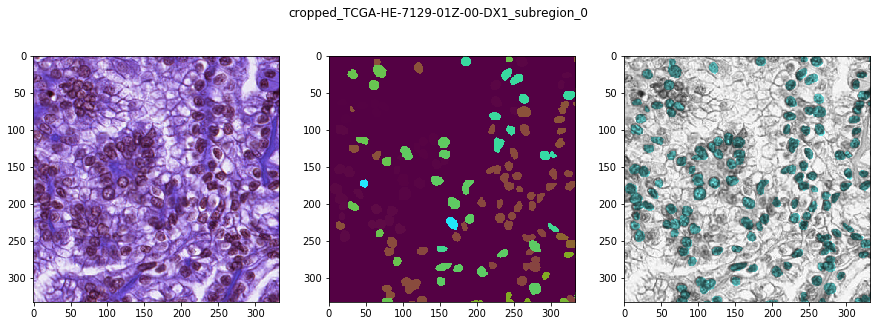

In [11]:
# def 
from skimage import data, color

def crop_image_and_mask(image, mask, centroid_df, num_grid = 4, item_name="unknown", display_crop=False): 
    image_w, image_h, image_c = image.shape
    mask_w, mask_h, _ = mask.shape

    x = np.linspace(0, image_w, num_grid).astype(int)
    y = np.linspace(0, image_h, num_grid).astype(int)

    image_crops = []
    mask_crops = []
    centroid_crops = []
    for x1, x2 in zip(x[:-1], x[1:]): 
        for y1, y2 in zip(y[:-1], y[1:]):
            image_crops.append(image[x1:x2, y1:y2, :])
            mask_crops.append(mask[x1:x2, y1:y2])
            
            adjusted_centroid_df = centroid_df.apply(
                    lambda row: 
                        (x1 < row['x'] <= x2) and (y1 < row['y'] <= y2), 
                    axis=1
                ).reset_index(drop=True)
            
            adjusted_centroid_df = centroid_df[
                centroid_df.apply(
                    lambda row: (x1 < row['x'] <= x2) and (y1 < row['y'] <= y2), axis=1)
            ].reset_index(drop=True)
            adjusted_centroid_df['x'] = adjusted_centroid_df['x'] - x1
            adjusted_centroid_df['y'] = adjusted_centroid_df['y'] - y1            

            centroid_crops.append(adjusted_centroid_df)

    if display_crop: 
        sidx = np.random.randint(low=0, high=len(image_crops), size=1)[0]
        image_hsv = color.rgb2hsv(image_crops[sidx])
        mask_hsv = mask_crops[sidx]
        mask_hsv = (mask_crops[sidx][:, :, :3] > np.min(mask_crops[sidx][:, :, :3])).astype(int)

        alpha=0.5
        image_hsv[..., 0] = mask_hsv[..., 0] * (1-alpha)
        image_hsv[..., 1] = mask_hsv[..., 1] * alpha

        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        axes[0].imshow(image_crops[sidx])
        axes[1].imshow(mask_crops[sidx])
        axes[2].imshow(color.hsv2rgb(image_hsv))
        
        plt.suptitle(f'cropped_{item_name}_subregion_{sidx}')

        plt.show()
    
    return image_crops, mask_crops, centroid_crops

image_crops, mask_crops, centroid_crops = crop_image_and_mask(
    image, 
    mask, 
    centroid_df,
    item_name = row['item_name'], 
    display_crop=True, 
    num_grid=4
)

((1000, 1000, 3), (1000, 1000, 3), (1000, 1000))

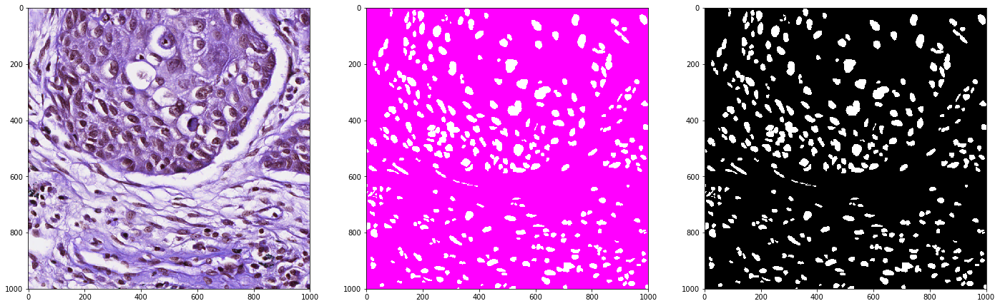

In [19]:
row = image_mask_centroid_meta.sample(1).iloc[0]


img = cv2.imread(row['file_path_image'])
mask = cv2.imread(row['file_path_mask'])
retval, mask = cv2.threshold(mask, 10, 255, cv2.THRESH_BINARY)
gray = cv2.cvtColor(mask, cv2.COLOR_RGB2GRAY)
gray.min(), gray.max()
fig, axes = plt.subplots(1, 3, figsize=(24, 8))
axes[0].imshow(img)
axes[1].imshow(mask, cmap='gray')
axes[2].imshow(gray, cmap='gray')

img.shape, mask.shape, gray.shape
# gray[np.where(gray == gray.min())] = 0

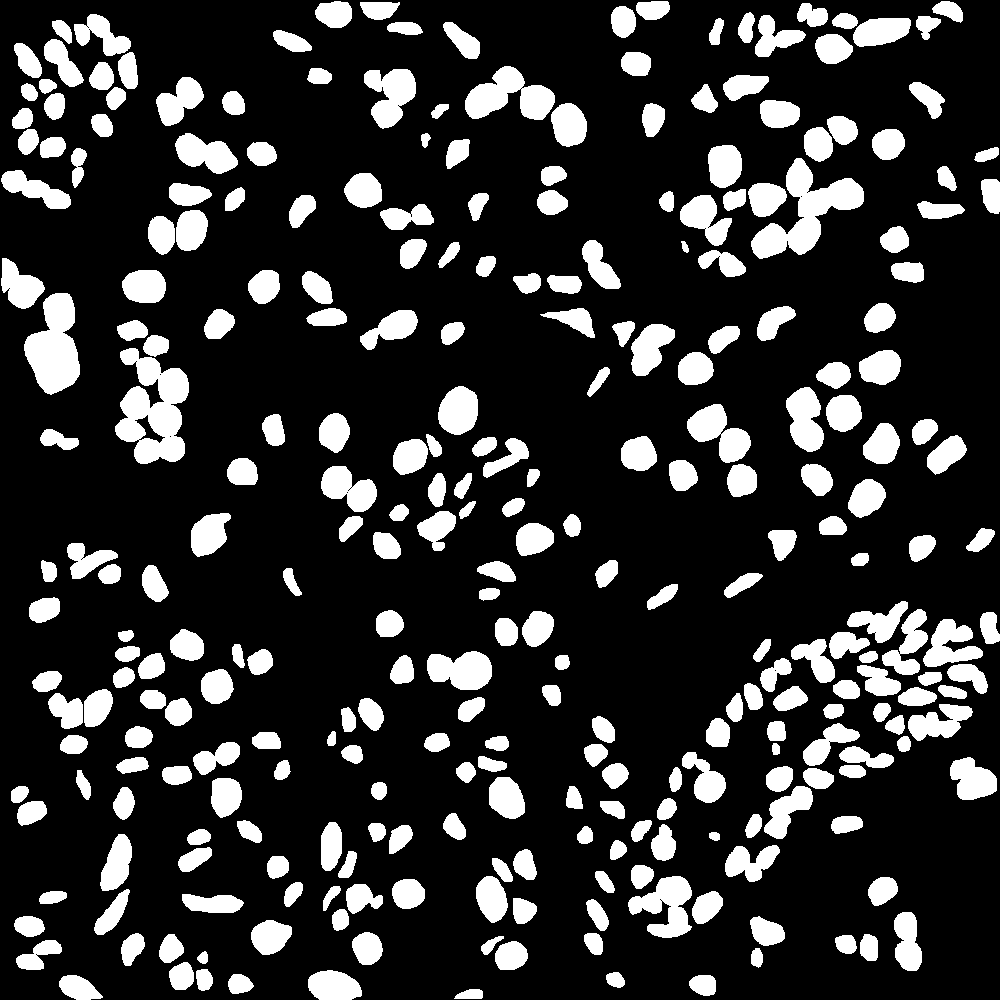

In [81]:
gray2 = gray - gray.min()
gray2[np.where(gray2 == gray2.max())] = 255 
PIL.Image.fromarray(gray2)

0.8 0.09999999999999998 0.09999999999999998


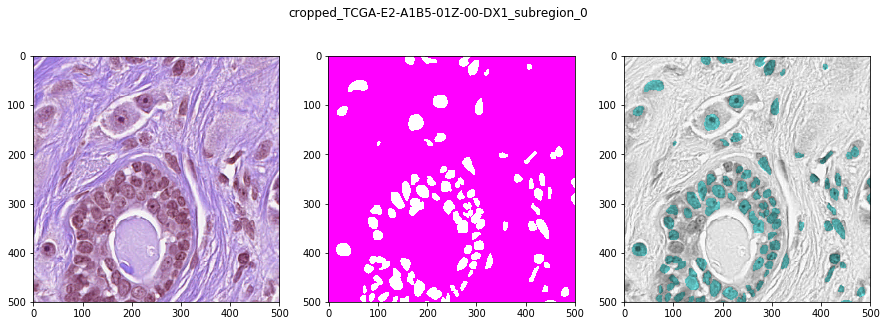

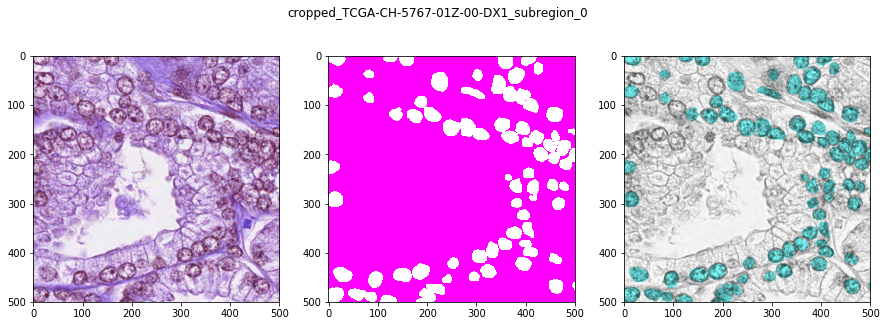

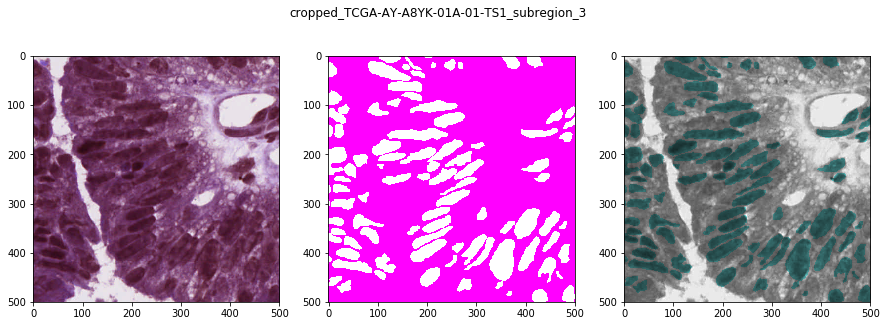

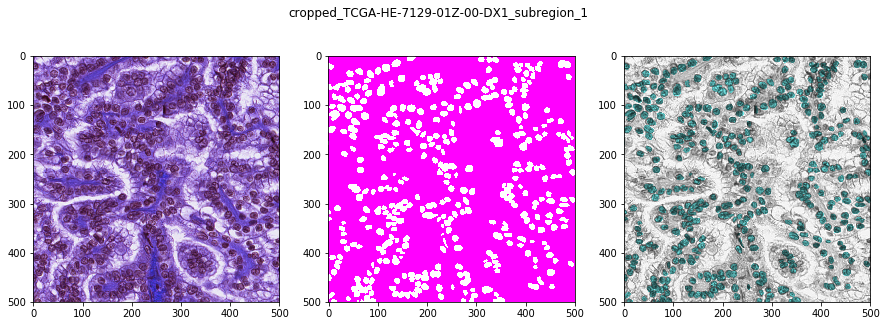

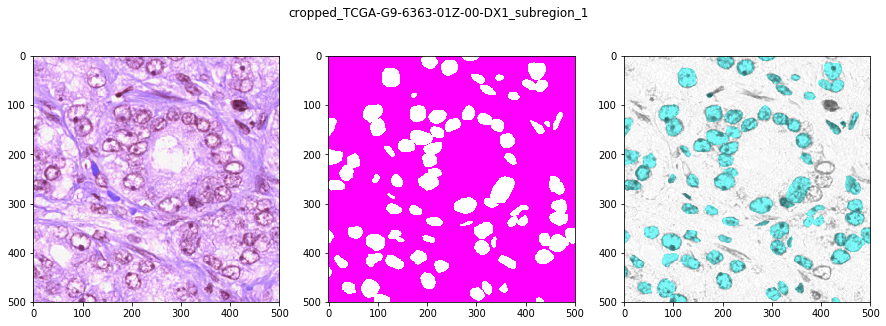

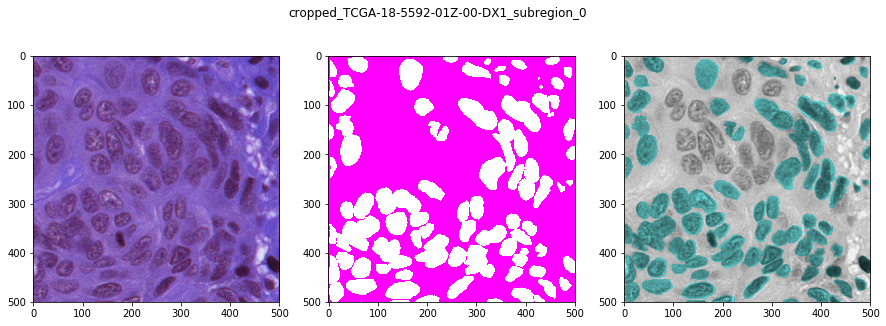

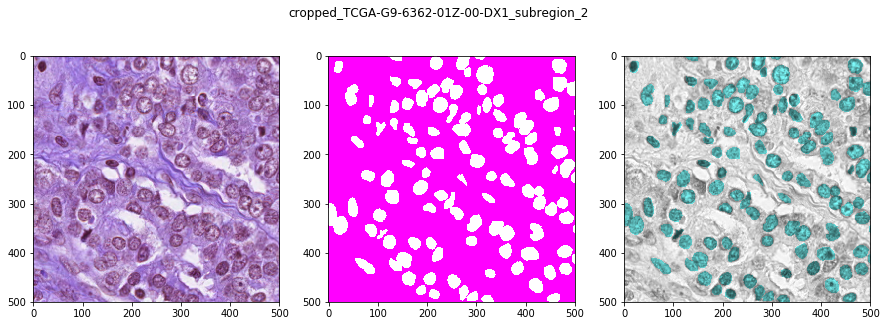

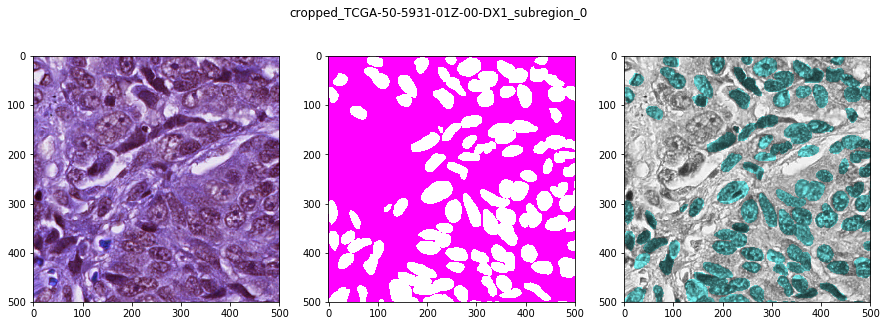

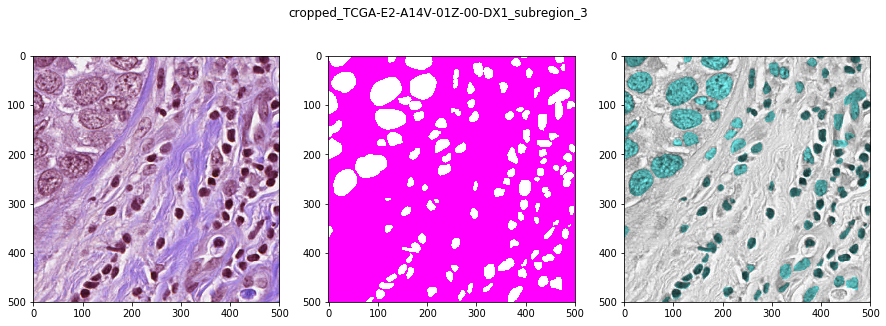

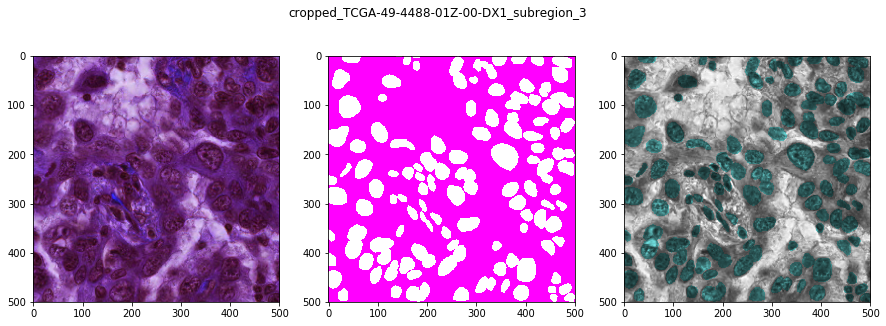

In [53]:
# Also need to crop centroids
# centroid_meta . . . 
monuseg_path = '/Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/'
grouth_truth_img_path = os.path.join(monuseg_path, "LabeledNucImages")
centroid_output_path = os.path.join(monuseg_path, "NucCentroids")

display_rate = 0.3
random_display = np.array([(r > (1-display_rate)) for r in np.random.random(len(image_with_mask_meta))])

num_grid = 3
frac_train = 0.8
frac_validation = 0.5*(1 - frac_train)
frac_test = 1 - frac_train - frac_validation
print(frac_train, frac_validation, frac_test)

for (idx, row), display_flag in tqdm(zip(image_mask_centroid_meta.iterrows(), random_display), total=len(image_with_mask_meta)): 
    image = cv2.imread(row['file_path_image'])
    mask_rgb = cv2.imread(row['file_path_mask'])

    retval, mask = cv2.threshold(mask_rgb, 10, 255, cv2.THRESH_BINARY)
    mask_gray = cv2.cvtColor(mask, cv2.COLOR_RGB2GRAY)
#     mask_gray = mask_gray - mask_gray.min()
#     mask_gray[np.where(mask_gray == mask_gray.max())] = 255 
    
    centroid_df = pd.read_csv(row['file_path'])
    image_crops, mask_crops, centroid_crops = crop_image_and_mask(
        image, mask, centroid_df, item_name=row['item_name'], display_crop=display_flag, num_grid=num_grid
    )
    
    ml_set = np.random.choice(
        ['train', 'validation', 'test'], 
        replace=True, 
        p=[frac_train, frac_validation, frac_test], 
        size=len(image_crops)
    )
    
    # Save to different ml_set
    for (idx, image_crop), mask_crop, centroid_crop, set_name in zip(enumerate(image_crops), mask_crops, centroid_crops, ml_set): 
        img_crop_out_path = os.path.join(image_path, set_name)
        mask_crop_out_path = os.path.join(mask_path, set_name)
        centroid_crop_out_path = os.path.join(centroid_output_path, set_name)
        
        for ml_set_path in [img_crop_out_path, mask_crop_out_path, centroid_crop_out_path]:             
            if not os.path.isdir(ml_set_path): 
                os.makedirs(ml_set_path)
        
        plt.imsave(os.path.join(img_crop_out_path, f"{row['item_name']}_{idx}.tif"), image_crop)
        plt.imsave(os.path.join(mask_crop_out_path, f"{row['item_name']}_{idx}.png"), PIL.Image.fromarray(mask_crop))
        centroid_crop.to_csv(os.path.join(centroid_crop_out_path, f"{row['item_name']}_{idx}.csv"), index=False)
        

In [56]:
print(
    len(glob(os.path.join(grouth_truth_img_path, "train", "*"))), 
    len(glob(os.path.join(grouth_truth_img_path, "validation", "*"))),
    len(glob(os.path.join(grouth_truth_img_path, "test", "*")))
)

99 15 21


In [55]:
grouth_truth_img_path

'/Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages'

In [158]:
# cells_path = '/Users/trimchala/BreastPathQ/breastpathq/datasets/cells/'
# !ulimit -n 10000

In [11]:
import torch
import torch.nn as nn
from torch.nn import Conv2d as Conv2D
import torch.nn.init as init
import torch.nn.functional as F
import numpy
from torch.nn import Upsample
from tqdm import tqdm_notebook as tqdm

class Up(nn.Module):
    def __init__(self, channel_in, channel_out):
        super(Up, self).__init__()
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear')
        self.conv = nn.Sequential(
            Conv2D(channel_in, channel_out, kernel_size = 3, padding = 1),
            nn.BatchNorm2d(channel_out),
            nn.ReLU(inplace=True)
        )

        
        
    def forward(self, x1, x2):
        # Input size - Batch_Size X Channel X Height of Activation Map  X Width of Activation Map
        # Upsample using bilinear mode and scale it to twice its size
        x1 = self.upsample(x1)
        # in 4D array - matching the last two in case of 5D it will take 
        # last three dimensions
        difference_in_X = x1.size()[2] - x2.size()[2]
        difference_in_Y = x1.size()[3] - x2.size()[3]
        # Padding it with the required value
        x2 = F.pad(x2, (difference_in_X // 2, int(difference_in_X / 2),
                        difference_in_Y // 2, int(difference_in_Y / 2)))
        # concat on channel axis
        x = torch.cat([x2, x1], dim=1)
        # Use convolution
        x = self.conv(x)
        return x

class Down(nn.Module):
    def __init__(self, channel_in, channel_out):
        super(Down, self).__init__()
        self.conv = nn.Sequential(
            Conv2D(channel_in, channel_out, kernel_size = 3, padding = 1),
            nn.BatchNorm2d(channel_out),
            nn.ReLU(inplace=True)
        )
    
    def forward(self, x):
        # Input size - Batch_Size X Channel X Height of Activation Map  X Width of Activation Map
        # Downsample First
        x = F.max_pool2d(x,2)
        # Use convolution
        x = self.conv(x)
        return x

class UNet(nn.Module):
    def __init__(self, channel_in, classes):
        super(UNet, self).__init__()
        self.input_conv = self.conv = nn.Sequential(
            Conv2D(channel_in, 8, kernel_size = 3, padding = 1),
            nn.BatchNorm2d(8),
            nn.ReLU(inplace=True)
        )
        self.down1 = Down(8, 16)
        self.down2 = Down(16, 32)
        self.down3 = Down(32, 32)
        self.up1 = Up(64, 16)
        self.up2 = Up(32, 8)
        self.up3 = Up(16, 4)
        self.output_conv = nn.Conv2d(4, classes, kernel_size = 1)
        
    def forward(self, x):
        x1 = self.input_conv(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x = self.up1(x4, x3)
        x = self.up2(x, x2)
        x = self.up3(x, x1)
        output = self.output_conv(x)
        return F.sigmoid(output)
    
def weights_init(m):
    if isinstance(m, nn.Conv2d):
        init.xavier_uniform(m.weight, gain=numpy.sqrt(2.0))
        init.constant(m.bias, 0.1)
    
def train_unet(model, epoch, train_dataloader, criterion):
    model.train()
    correct = 0
    for batch_idx, data in tqdm(enumerate(train_dataloader), total=len(train_dataloader)):
        data, target = Variable(data["image"]), Variable(data["mask"])
        optimizer.zero_grad()
        output = model.forward(data.float())
        loss = criterion(output.float(), target.float())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        if batch_idx % 1 == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, batch_idx * len(data), len(train_dataloader.dataset),
                100. * batch_idx / len(train_dataloader), loss.data[0]))
            
def test_unet(model, val_dataloader, criterion):
    model.eval()
    test_loss = 0
    for data in tqdm(val_dataloader):
        data, target = Variable(data["image"], volatile=True), Variable(data["mask"])
        output = model(data.float())
        # print(output.data[0])
        test_loss += criterion(output.float(), target.float()).data[0] # sum up batch loss
    test_loss /= len(val_dataloader.dataset)
    print("Average Loss: ", test_loss)

# Continue Training from saved state

In [12]:
# Data Augmentation 
# Random Crop
# Random Flip
import os
import skimage
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, utils
from torch.autograd import Variable
from torch.utils.data.dataset import Dataset
from torchvision import transforms
from torchvision.transforms import Compose, TenCrop, Lambda
import torchvision.transforms as vis_tf
from glob import glob
import cv2
from matplotlib import pyplot as plt
%matplotlib inline
# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

%load_ext autoreload

%autoreload 2
plt.ion()   # interactive mode

dataset_path = '/Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining'
image_path = os.path.join(dataset_path, 'TissueImages')
mask_path = os.path.join(dataset_path, 'LabeledNucImages')

class NuclearMaskedDataSet(Dataset): 
    def __init__(self, image_path, mask_path, transforms=None):
        # stuff
        self.image_path = image_path
        self.mask_path = mask_path
        self.transforms = transforms
        self.image_list = glob(os.path.join(self.image_path, "*.tif"))
        self.mask_list = glob(os.path.join(self.mask_path, "*.png"))
        
    def __getitem__(self, index):
        img = PIL.Image.fromarray(cv2.imread(self.image_list[index]))
        mask_gray = PIL.Image.fromarray(cv2.imread(self.mask_list[index])).convert('L')

        # This follows the unet convention
        # We should put an option arg to specify which network to train with
        ch1 = (mask_gray == mask_gray.min()).astype(int)
        ch2 = (mask_gray > mask_gray.min()).astype(int)
        mask = np.dstack([ch1, ch2])

        # Transform only on training set
        if self.transforms is not None:
            img = self.transforms(img)
            mask = self.transforms(mask)
        else: 
            pil2tensor = vis_tf.Compose([vis_tf.ToTensor()])
            img = pil2tensor(img)
            mask = pil2tensor(mask)

        return {
            "image": img,
            "mask": mask
        }

    def __len__(self):
        return len(self.image_list)
    
crop_size = 256
crop_padding = 4
transformations = vis_tf.Compose([
    vis_tf.RandomHorizontalFlip(),
    vis_tf.RandomVerticalFlip(),
    vis_tf.RandomCrop(size=crop_size, padding=crop_padding), 
    vis_tf.ToTensor()
])

train_ds = NuclearMaskedDataSet(
    image_path=os.path.join(image_path, "train"), 
    mask_path=os.path.join(mask_path, "train"),
    transforms=transformations
)

val_ds = NuclearMaskedDataSet(
    image_path=os.path.join(image_path, "validation"),
    mask_path=os.path.join(mask_path, "validation"), 
    transforms=transformations
)

test_ds = NuclearMaskedDataSet(
    image_path=os.path.join(image_path, "test"), 
    mask_path=os.path.join(mask_path, "test"), 
    transforms=transformations
)

batch_size = 32
train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_ds, batch_size=batch_size, shuffle=True, num_workers=4)
test_loader = DataLoader(test_ds, batch_size=batch_size, shuffle=True, num_workers=4)


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
outputs = output.float().detach().numpy

In [13]:
def chw_to_hwc(img):
    return np.transpose(img, axes=[1, 2, 0])

trained_model = model_instance
trained_model.eval()
for data in tqdm(val_loader):
    data, target = Variable(data["image"], volatile=True), Variable(data["mask"])
    output = trained_model(data.float())
print(data.shape, output.shape)

for input_instance, target_instance, output_instance in zip(data, target, output):     
    input_hwc = chw_to_hwc(input_instance.detach().numpy())
    target_hwc =  skimage.color.rgb2gray(chw_to_hwc(target_instance.detach().numpy()))
    output_hwc = skimage.color.rgb2gray(chw_to_hwc(output_instance.detach().numpy()))
    
    fig, axes = plt.subplots(1, 3, figsize=(16, 8))
    axes[0].imshow(input_hwc)
    axes[1].imshow(target_hwc, cmap='gray')
    axes[2].imshow(output_hwc, cmap='gray')

NameError: name 'model_instance' is not defined

In [7]:
epoches = 1000
checkpoint_interval = 100

base_epoch = 1000
trained_model_path = os.path.join(monuseg_path, "torch_models")
last_train_path = os.path.join(trained_model_path, "last_trained")

# for checkpoint_dir in [trained_model_path, last_train_path]:
#     if not os.path.isdir(checkpoint_dir): 
#         os.makedirs(checkpoint_dir)
    
# last_trained_model = glob(last_train_path)[-1]
# model_instance = UNet(3, 3)
# model_instance.load_state_dict(torch.load(last_trained_model))
optimizer = optim.Adam(
    model_instance.parameters(), 
    lr=0.0001, 
    decay=float(args.decay), 
    amsgrad=True)
# criterion = nn.BCELoss()

for epoch in range(epoches):
    if (epoch > 0) and (np.mod(epoch, checkpoint_interval) == 0): 
        torch.save(
            model_instance.state_dict(), 
            os.path.join(trained_model_path, f"monuseg_unet33_{epoch+base_epoch}ep.pth")
        )
        test_unet(model=model_instance, val_dataloader=val_loader, criterion=criterion)
    train_unet(model=model_instance, epoch=epoch, train_dataloader=train_loader, criterion=criterion)


torch.save(
    model_instance.state_dict(), 
    os.path.join(trained_model_path, "last_trained", f"monuseg_unet33_{epoch+base_epoch}ep.pth")
)


NameError: name 'monuseg_path' is not defined

In [59]:
# Try predicting on cells data set
last_trained_model = glob(last_train_path)[-1]

# Load cell dataset
cel

In [127]:
test_unet(model=model_instance, val_dataloader=val_loader, criterion=criterion)

Average Loss:  tensor(0.0114)


In [ ]:
# Fine-tune nuclei segmentation model
# - UNet retrain on MoNucSeq
# - Multitask UNet --> output segments & centroid
# http://www.jpathinformatics.org/temp/JPatholInform7129-540486_013004.pdf
# https://towardsdatascience.com/instance-segmentation-automatic-nucleus-detection-a169b3a99477
# https://spark-in.me/post/playing-with-dwt-and-ds-bowl-2018
# https://github.com/bvezilic/Nuclei-segmentation
# 
# CellularityNet : Multittask Regression Learning
# 1. output nuclei centroid
# 2. output percent cellularity
# 3. output number of nuclei

In [14]:
import sys
sys.path.append('/Users/trimchala/BreastPathQ/breastpathq/Pytorch-UNet/')
from optparse import OptionParser
import numpy as np
import torch
# import torch.backends.cudnn as cudnn
import torch.nn as nn
import torch.nn.functional as F
from torch import optim
from eval import eval_net
from unet import UNet as thisunet
from utils import get_ids, split_ids, split_train_val, get_imgs_and_masks, batch, hwc_to_chw, chw_to_hwc
from utils import resize_and_crop, get_square, normalize, hwc_to_chw

def to_cropped_imgs(ids, dir, suffix, scale):
    """From a list of tuples, returns the correct cropped img"""
    for id, pos in ids:
        im = resize_and_crop(Image.open(dir + id + suffix).convert('RGB'), scale=scale)
        yield get_square(im, pos)

def get_imgs_and_masks(ids, dir_img, dir_mask, scale, suffix='.tif'):
    """Return all the couples (img, mask)"""

    imgs = to_cropped_imgs(ids, dir_img, suffix, scale)

    # need to transform from HWC to CHW
    imgs_switched = map(hwc_to_chw, imgs)
    imgs_normalized = map(normalize, imgs_switched)

    masks = to_cropped_imgs(ids, dir_mask, '.png', scale)

    return zip(imgs_normalized, masks)

def rgbda2rga_chw(img): 
    return hwc_to_chw(
        skimage.color.rgba2rgb(
            chw_to_hwc(img)
        )
    )

epochs=5
batch_size=5
lr=0.1
val_percent=0.05
save_cp=True
gpu=False
img_scale=1

dir_img = os.path.join(image_path, "train/")
dir_mask = os.path.join(mask_path, "train/")
dir_checkpoint = '/Users/trimchala/BreastPathQ/checkpoints/'

ids = get_ids(dir_img)
ids = split_ids(ids)

iddataset = split_train_val(ids, val_percent)

net = thisunet(n_channels=3, n_classes=1)
optimizer = optim.SGD(
    net.parameters(),
    lr=lr,
    momentum=0.9,
    weight_decay=0.0005
)

criterion = nn.BCELoss()

for epoch in range(epochs):
    print('Starting epoch {}/{}.'.format(epoch + 1, epochs))
    net.train()

    # reset the generators
    train_ds = get_imgs_and_masks(iddataset['train'], dir_img, dir_mask, img_scale)
    val_ds = get_imgs_and_masks(iddataset['val'], dir_img, dir_mask, img_scale)

    epoch_loss = 0

    for i, b in tqdm(enumerate(batch(train_ds, batch_size))):
        imgs = np.array([i[0] for i in b]).astype(np.float32)
        true_masks = np.array([i[1] for i in b])

        imgs = torch.from_numpy(imgs)
        true_masks = torch.from_numpy(true_masks)

        if gpu:
            imgs = imgs.cuda()
            true_masks = true_masks.cuda()

        masks_pred = net(imgs)
        masks_probs = F.sigmoid(masks_pred)
        masks_probs_flat = masks_probs.view(-1)

        true_masks_flat = true_masks.view(-1)

        print(masks_probs_flat.shape, true_masks_flat.shape)
        loss = criterion(masks_probs_flat, true_masks_flat)
        epoch_loss += loss.item()

        print('{0:.4f} --- loss: {1:.6f}'.format(i * batch_size / N_train, loss.item()))

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    print('Epoch finished ! Loss: {}'.format(epoch_loss / i))

    if 1:
        val_dice = eval_net(net, val_ds, gpu)
        print('Validation Dice Coeff: {}'.format(val_dice))

    if save_cp:
        torch.save(net.state_dict(),
                   dir_checkpoint + 'CP{}.pth'.format(epoch + 1))
        print('Checkpoint {} saved !'.format(epoch + 1))


ModuleNotFoundError: No module named 'pydensecrf'

In [15]:
train_ds = get_imgs_and_masks(iddataset['train'], dir_img, dir_mask, img_scale)
val_ds = get_imgs_and_masks(iddataset['val'], dir_img, dir_mask, img_scale)

NameError: name 'get_imgs_and_masks' is not defined

In [36]:
for i, b in enumerate(batch(train_ds, batch_size)):
    imgs = np.array([ i[0] for i in b ]).astype(np.float32)
    true_masks = np.array([ i[1] for i in b]).astype(np.float32)
    
    imgs = torch.from_numpy(imgs)
    true_masks = torch.from_numpy(true_masks)
    
    masks_pred = net(imgs)
    masks_probs = F.sigmoid(masks_pred)
    masks_probs_flat = masks_probs.view(-1)

    true_masks_flat = true_masks.view(-1)

    loss = criterion(masks_probs_flat, true_masks_flat)


ValueError: could not broadcast input array from shape (3,167,166) into shape (3)

[(3, 167, 166), (3, 167, 166), (3, 166, 166), (3, 167, 167), (3, 167, 166)]

In [27]:
im.shape

(334, 334, 3)

In [201]:
true_masks.shape

(1, 166, 166, 4)